In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import hamming


fontanna1 = cv2.imread('data/fontanna1.jpg')
fontanna2 = cv2.imread('data/fontanna2.jpg')

In [2]:
def display(img, points=None):
    if points is not None:
        points = points[::-1]
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.plot(points[0], points[1], '*r')
    else:
        plt.imshow(img, cmap='gray')
    plt.show()

In [3]:
def harris(imgGray, kernelSize, k):
    Ix = cv2.Sobel(imgGray, cv2.CV_64F, 1, 0, ksize=kernelSize)
    Iy = cv2.Sobel(imgGray, cv2.CV_64F, 0, 1, ksize=kernelSize)

    Ix2 = np.square(Ix)
    Iy2 = np.square(Iy)
    Ixy = np.multiply(Ix, Iy)

    Ix2 = cv2.GaussianBlur(Ix2, (kernelSize, kernelSize), 0)
    Iy2 = cv2.GaussianBlur(Iy2, (kernelSize, kernelSize), 0)
    Ixy = cv2.GaussianBlur(Ixy, (kernelSize, kernelSize), 0)

    M = [[Ix2, Ixy], [Ixy, Iy2]]
    det = np.multiply(M[0][0], M[1][1]) - np.multiply(M[0][1], M[1][0])
    trace = np.trace(M)

    H = det - k * np.square(trace)
    H_normalized = cv2.normalize(H, None, 0, 1, norm_type=cv2.NORM_MINMAX)
    return H_normalized

In [4]:
K = 0.05
SIZE = 7
fontannaH1 = harris(cv2.cvtColor(fontanna1, cv2.COLOR_BGR2GRAY), SIZE, K)
fontannaH2 = harris(cv2.cvtColor(fontanna2, cv2.COLOR_BGR2GRAY), SIZE, K)

In [5]:
from scipy.ndimage import maximum_filter

def findMax(img, filterSize, threshold) :
    maxData = maximum_filter(img, filterSize)
    maxima = (img == maxData)
    diff = img > threshold

    maxima[diff == 0] = 0
    return np.nonzero(maxima)

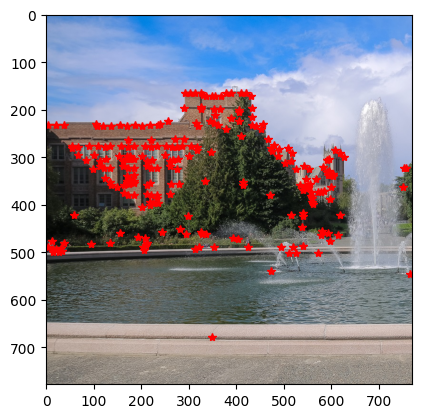

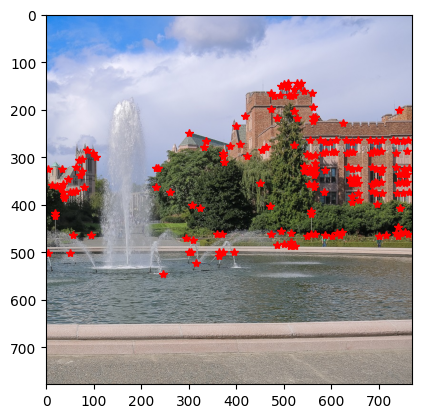

In [6]:
threshold = 0.4
FILTER = 7
display(fontanna1, findMax(fontannaH1, FILTER, threshold))
display(fontanna2, findMax(fontannaH2, FILTER, threshold))

In [7]:
budynek1 = cv2.imread('data/budynek1.jpg')
budynek2 = cv2.imread('data/budynek2.jpg')

budynekH1 = harris(cv2.cvtColor(budynek1, cv2.COLOR_BGR2GRAY), SIZE, K)
budynekH2 = harris(cv2.cvtColor(budynek2, cv2.COLOR_BGR2GRAY), SIZE, K)

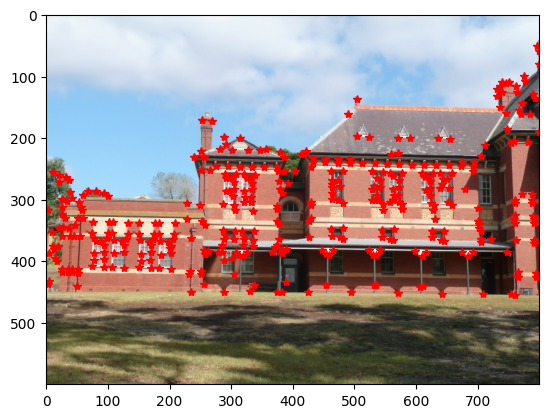

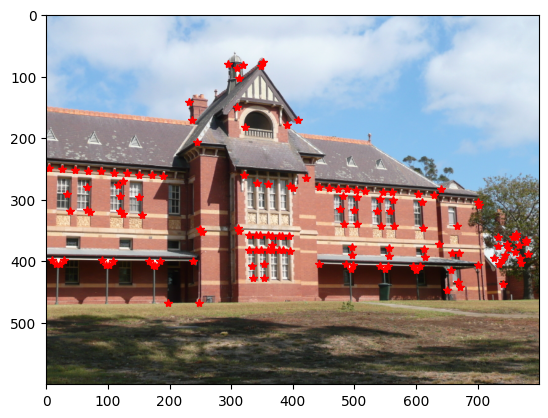

In [8]:
threshold = 0.4
FILTER = 7
display(budynek1, findMax(budynekH1, FILTER, threshold))
display(budynek2, findMax(budynekH2, FILTER, threshold))

In [9]:
def describe(img, pts, size, affinic=False):
    Y, X = img.shape[:2]
    pts = list(filter(lambda pt: pt[0] >= size and pt[0]< Y-size and pt[1] >= size and pt[1] < X-size, zip(pts[0], pts[1])))

    patches = []
    for pt in pts:
        patch = img[pt[0]-size:pt[0]+size+1, pt[1]-size:pt[1]+size+1]

        if affinic:
            patchMean = np.mean(patch)
            patchSTD = np.std(patch)
            patch = (patch - patchMean) / patchSTD

        patches.append(patch.flatten())

    return list(zip(pts, patches))

In [10]:
# returns (point, patch, matched point, matched patch, distance)

def match(desc1, desc2, n):
    matches = []
    for d1 in desc1:
        dists = [(d2[0], d2[1], np.sum(np.square(d1[1] - d2[1]))) for d2 in desc2]
        dists.sort(key=lambda x: x[-1])
        matches.append((d1[0], d1[1], dists[0][0], dists[0][1], dists[0][2]))

    matches = sorted(matches, key=lambda x: x[-1])
    return matches[:n]

In [11]:
def getPointsFromMatch(matches):
    return [([m[0][0], m[0][1]], [m[2][0], m[2][1]]) for m in matches]

In [12]:
from data.pm import plot_matches

def drawMatches(img1, img2,
                K=0.05, kernelSize=7, threshold=0.4, filterSize=7,
                K2=0.05, kernelSize2=7, threshold2=0.4, filterSize2=7,
                nMatches=10, windowSize=7, affinic=False):
    h1 = harris(cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY), kernelSize, K)
    h2 = harris(cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY), kernelSize2, K2)

    pts1 = findMax(h1, filterSize, threshold)
    pts2 = findMax(h2, filterSize2, threshold2)

    desc1 = describe(cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY), pts1, windowSize, affinic)
    desc2 = describe(cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY), pts2, windowSize, affinic)

    matches = match(desc1, desc2, nMatches)
    points = getPointsFromMatch(matches)

    display(img1, pts1)
    display(img2, pts2)

    plot_matches(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB), cv2.cvtColor(img2, cv2.COLOR_BGR2RGB), points)

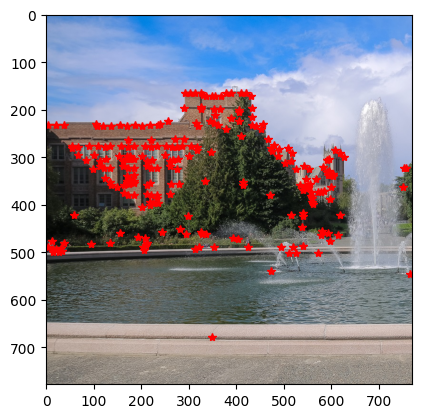

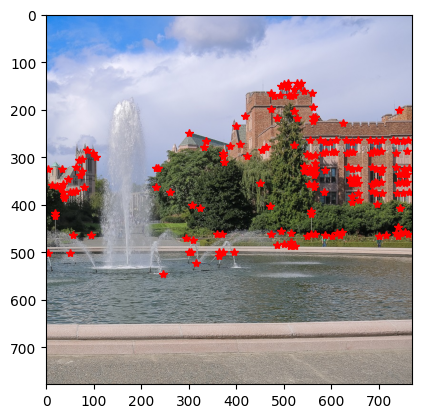

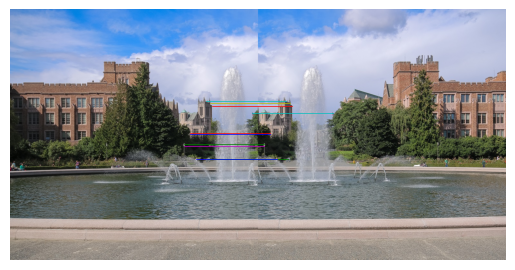

In [13]:
drawMatches(fontanna1, fontanna2)

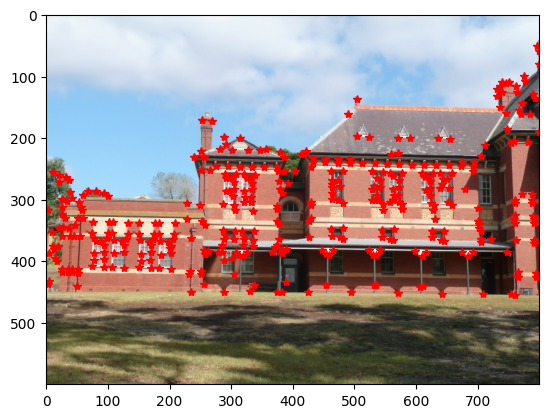

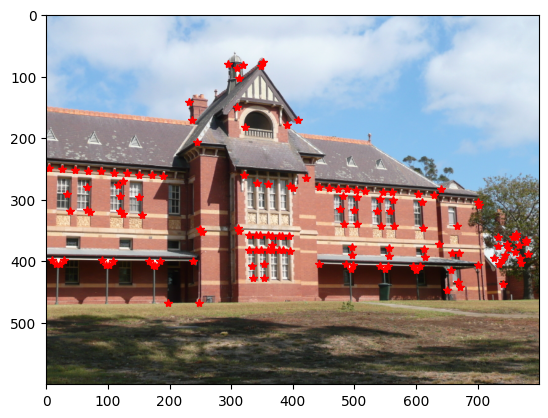

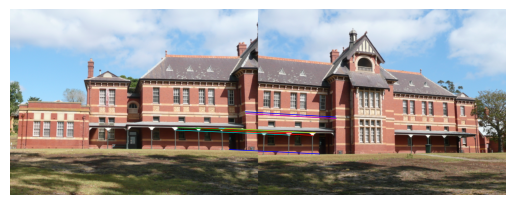

In [14]:
drawMatches(budynek1, budynek2)

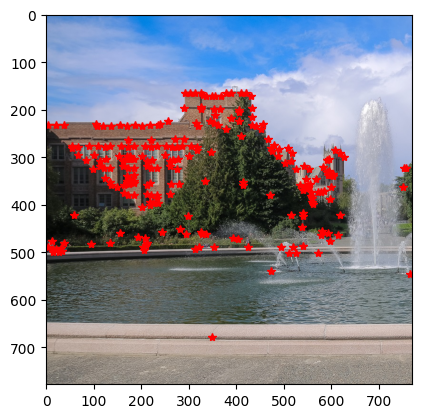

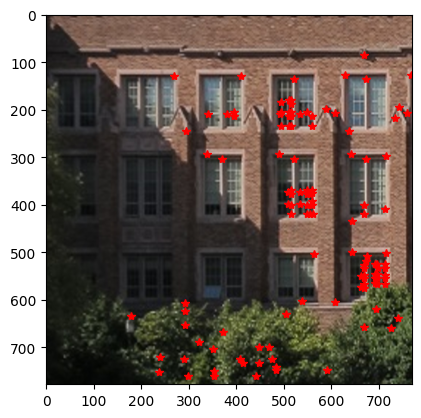

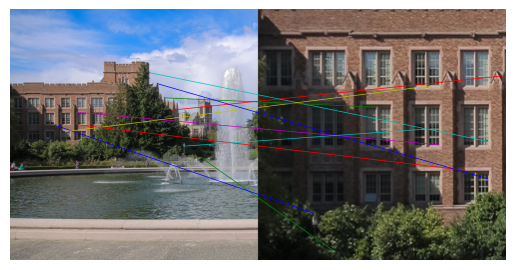

In [15]:
fontannaPow = cv2.imread('data/fontanna_pow.jpg')
fontannaPow = cv2.resize(fontannaPow, (fontanna1.shape[1], fontanna1.shape[0]))

drawMatches(fontanna1, fontannaPow, threshold2=0.5)

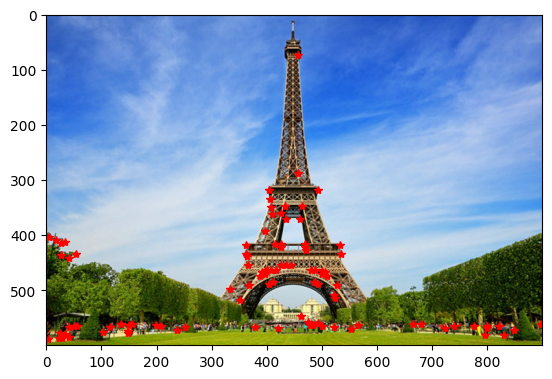

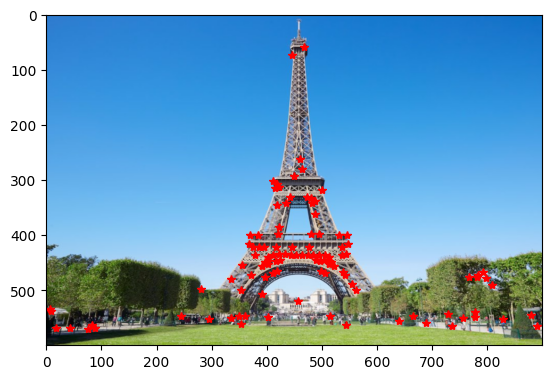

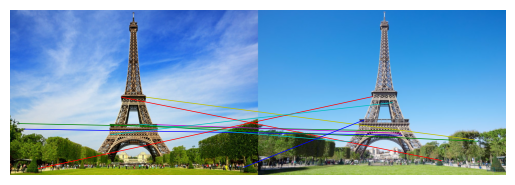

In [16]:
eiffel1 = cv2.imread('data/eiffel1.jpg')
eiffel2 = cv2.imread('data/eiffel2.jpg')
eiffel2 =  cv2.resize(eiffel2, (eiffel1.shape[1], eiffel1.shape[0]))

drawMatches(eiffel1, eiffel2)

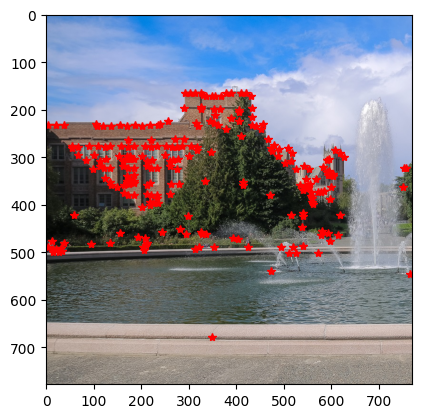

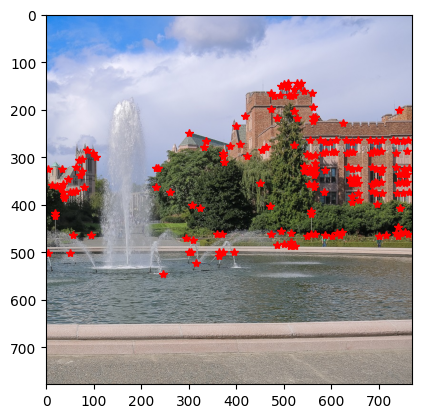

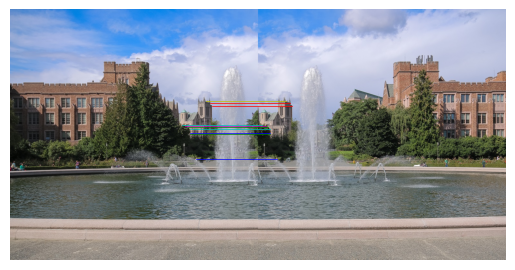

In [17]:
drawMatches(fontanna1, fontanna2, affinic=True)

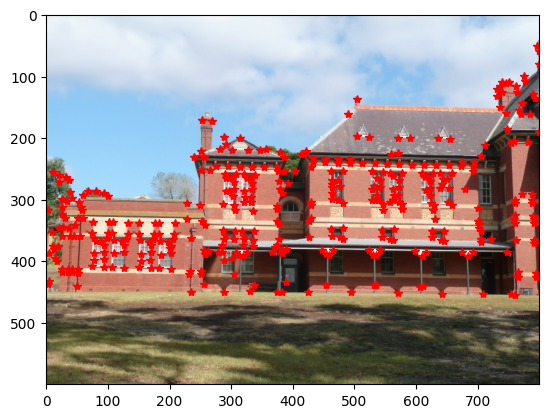

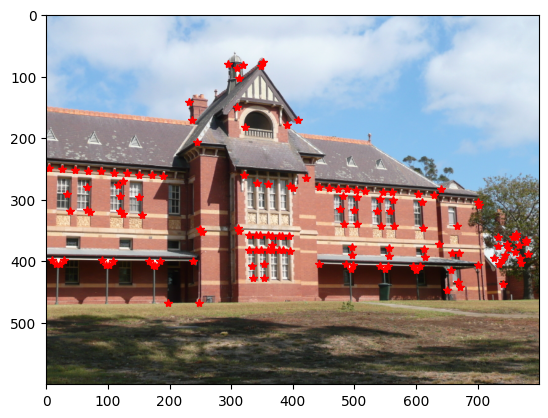

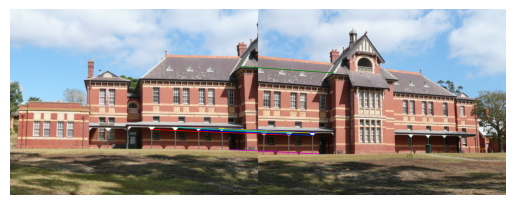

In [18]:
drawMatches(budynek1, budynek2, affinic=True)

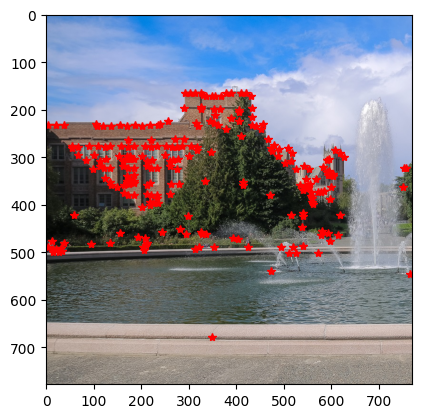

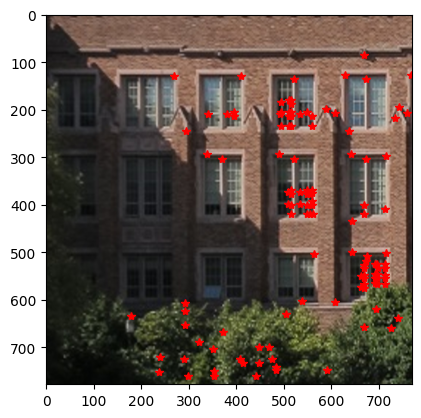

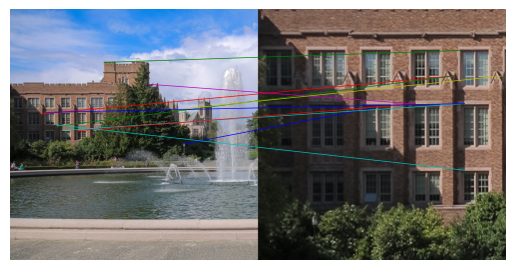

In [19]:
drawMatches(fontanna1, fontannaPow, threshold2=0.5, affinic=True)

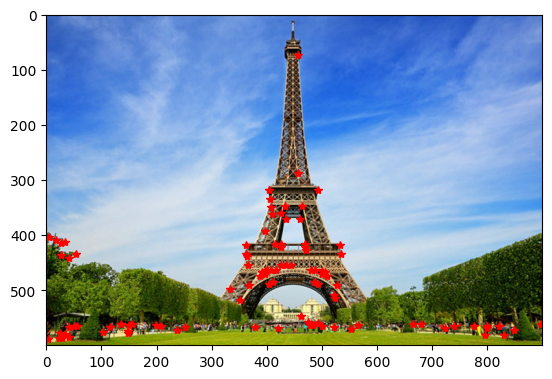

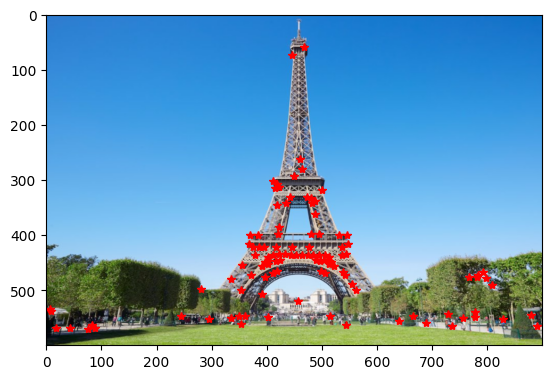

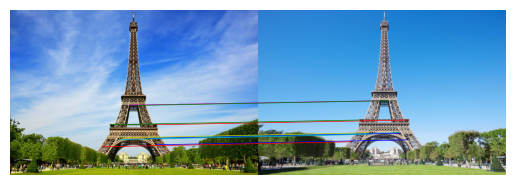

In [20]:
drawMatches(eiffel1, eiffel2, affinic=True)

In [21]:
def fast_corner_detection(img, threshold=25, n=9, k=0.05):
    # Convert the image to grayscale
    if len(img.shape) == 3:
        img = np.mean(img, axis=2).astype(np.uint8)

    height, width = img.shape

    circle_offsets = [(-3, 0), (-3, 1), (-2, 2), (-1, 3), (0, 3), (1, 3),
                      (2, 2), (3, 1), (3, 0), (3, -1), (2, -2), (1, -3),
                      (0, -3), (-1, -3), (-2, -2), (-3, -1)]

    corners = []
    harris_output = cv2.normalize(harris(img, 7, k), None, 0, 1, cv2.NORM_MINMAX, dtype=cv2.CV_32F)


    for y in range(3, height-3):
        for x in range(3, width-3):
            center = img[y, x]

            dark_count = 0
            light_count = 0

            for dy, dx in circle_offsets:
                pixel_value = img[y + dy, x + dx]
                if pixel_value > center + threshold:
                    light_count += 1
                elif pixel_value < center - threshold:
                    dark_count += 1

            # Check if the number of contiguous dark or light pixels is above the threshold
            if light_count >= n or dark_count >= n:
                corners.append(((y, x), harris_output[y, x]))

    return corners

In [22]:
def nonmax_suppression(img, harris_corners):
    suppressed_corners = []

    max_harris_corners = np.full_like(img, -np.inf, dtype=float)


    for (y, x), harris_value in harris_corners:
        for dy in range(-1, 2):
            for dx in range(-1, 2):
                ny, nx = y + dy, x + dx
                if 0 <= ny < img.shape[0] and 0 <= nx < img.shape[1]:
                    max_harris_corners[ny, nx] = max(max_harris_corners[ny, nx], harris_value)


    for (y, x), harris_value in harris_corners:
        if harris_value == max_harris_corners[y, x]:
            suppressed_corners.append(((y, x), harris_value))

    return suppressed_corners

In [23]:
def min_neigh_filter(image, harris_corners, neighborhood_size=31):
    filtered_corners = []
    half_size = neighborhood_size // 2

    height, width = image.shape

    for (y, x), harris_value in harris_corners:
        if (y - half_size >= 0 and y + half_size < height and
            x - half_size >= 0 and x + half_size < width):
            filtered_corners.append(((y, x), harris_value))

    return filtered_corners

In [24]:
def highest_harris_measure_filter(harris_corners, n):
    harris_corners.sort(key=lambda x: x[1], reverse=True)
    return [(y, x) for (y, x), _ in harris_corners[:n]]

In [25]:
def prepare(image, harris_corners, n):
    harris_corners = nonmax_suppression(image, harris_corners)
    harris_corners = min_neigh_filter(image, harris_corners)
    corners = highest_harris_measure_filter(harris_corners, n)
    return corners

In [26]:
def find_centroid(corners):
    y_sum = sum([y for y, x in corners])
    x_sum = sum([x for y, x in corners])
    orient = np.arctan2(y_sum, x_sum)
    return y_sum / len(corners), x_sum / len(corners), orient

In [27]:
def brief_desc(image, corners, size=31, kernel=5, n=256):
    half_size = size // 2

    descriptors = []

    # Get point pairs from file
    points = []
    with open('data/orb_descriptor_positions.txt', 'r') as f:
        for line in f:
            y1, x1, y2, x2 = map(lambda x: int(float(x)), line.split(' '))
            points.append((y1, x1, y2, x2))

    # Process each corner to compute the descriptor
    for y, x in corners:
        patch = image[y-half_size : y+half_size + 1, x-half_size : x+half_size + 1]
        blurred_patch = cv2.GaussianBlur(patch, (kernel, kernel), 0)

        descriptor = np.zeros(n, dtype=np.uint8)

        for i, (y1, x1, y2, x2) in enumerate(points):
            if blurred_patch[y1, x1] < blurred_patch[y2, x2]:
                descriptor[i] = 1

        descriptors.append(((y, x), descriptor))

    return descriptors


class DescriptorsPair:
    pt1 = None
    pt2 = None
    desc1 = None
    desc2 = None
    distance = None

    def __init__(self, pt1, pt2, desc1, desc2, dist):
        self.pt1 = pt1
        self.pt2 = pt2
        self.desc1 = desc1
        self.desc2 = desc2
        self.distance = dist



def match_keypoints(descriptors1, descriptors2, n):
    matches = []
    for (y1, x1), desc1 in descriptors1:
        for (y2, x2), desc2 in descriptors2:
            # Compute the Hamming distance
            dist = hamming(desc1, desc2)
            matches.append(DescriptorsPair((y1, x1), (y2, x2), desc1, desc2, dist))

    # Sort matches based on the distance
    matches.sort(key=lambda x: x.distance)

    # Return the top N matches
    return matches[:n]

In [28]:
def displayCorners(img, corners):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    for x, y in corners:
        plt.plot(y, x, 'r*')
    plt.show()

def plotMatchedDescriptors(im1, im2, descriptor_pairs: list[DescriptorsPair]):
    from data.pm import appendimages
    colors=['r','g','b','c','m','y']
    im3 = appendimages(im1,im2)

    plt.figure()
    plt.imshow(cv2.cvtColor(im3, cv2.COLOR_BGR2RGB))

    cols1 = im1.shape[1]

    for i, desc_pair in enumerate(descriptor_pairs):
        plt.plot([desc_pair.pt1[1], desc_pair.pt2[1] + cols1], [desc_pair.pt1[0], desc_pair.pt2[0]], colors[i % 6], linewidth=0.5)
    plt.axis('off')

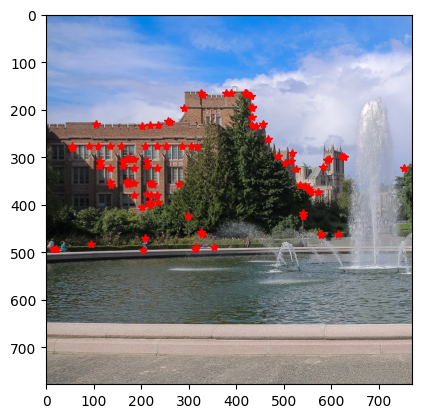

In [29]:
fontanna1Gray = cv2.cvtColor(fontanna1, cv2.COLOR_BGR2GRAY)
harris_corners = fast_corner_detection(fontanna1)
corners = prepare(fontanna1Gray, harris_corners, 100)
fontanna_1_descriptors = brief_desc(fontanna1Gray, corners)
displayCorners(fontanna1, corners)

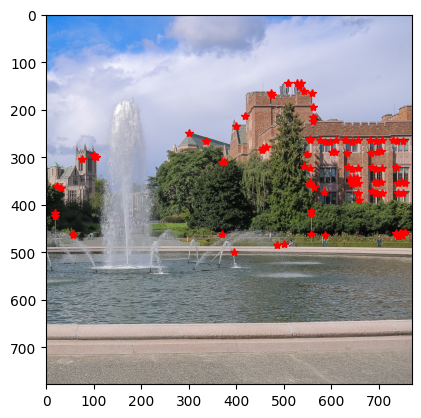

In [30]:
fontanna2Gray = cv2.cvtColor(fontanna2, cv2.COLOR_BGR2GRAY)
harris_corners = fast_corner_detection(fontanna2)
corners = prepare(fontanna2Gray, harris_corners, 100)
fontanna_2_descriptors = brief_desc(fontanna2Gray, corners)
displayCorners(fontanna2, corners)

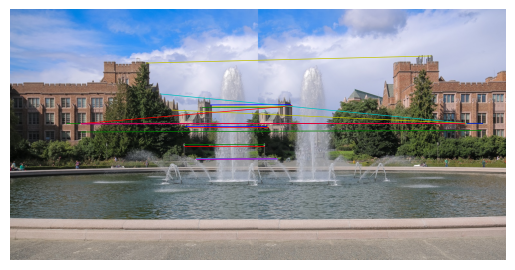

In [31]:
matches = match_keypoints(fontanna_1_descriptors, fontanna_2_descriptors, 20)
plotMatchedDescriptors(fontanna1, fontanna2, matches)

In [32]:
left_panorama = cv2.imread('data/left_panorama.jpg')
left_panorama_gray = cv2.cvtColor(left_panorama, cv2.COLOR_BGR2GRAY)

right_panorama = cv2.imread('data/right_panorama.jpg')
right_panorama_gray = cv2.cvtColor(right_panorama, cv2.COLOR_BGR2GRAY)

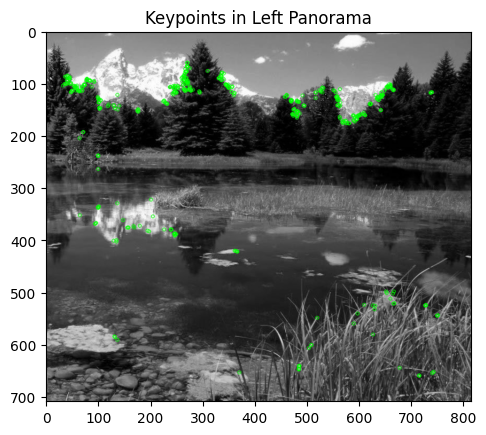

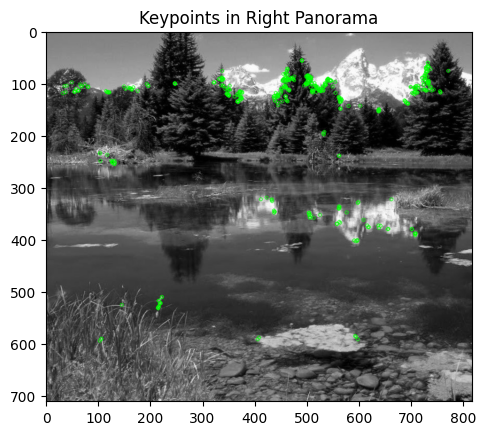

In [33]:
# Using ORB to find characteristic points on both images
orb = cv2.ORB_create()

# Detect keypoints and descriptors for left panorama image
left_keypoints, left_descriptors = orb.detectAndCompute(left_panorama_gray, None)
left_image_with_keypoints = cv2.drawKeypoints(left_panorama_gray, left_keypoints, None, color=(0, 255, 0), flags=0)
plt.imshow(left_image_with_keypoints, cmap='gray')
plt.title("Keypoints in Left Panorama")
plt.show()

# Detect keypoints and descriptors for right panorama image
right_keypoints, right_descriptors = orb.detectAndCompute(right_panorama_gray, None)
right_image_with_keypoints = cv2.drawKeypoints(right_panorama_gray, right_keypoints, None, color=(0, 255, 0), flags=0)
plt.imshow(right_image_with_keypoints, cmap='gray')
plt.title("Keypoints in Right Panorama")
plt.show()

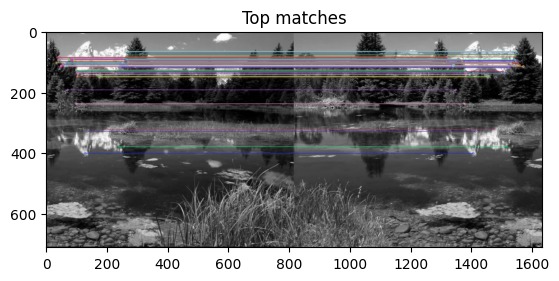

In [34]:
# Matching keypoints between left and right panorama images using the descriptors
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(left_descriptors, right_descriptors)
matches = sorted(matches, key=lambda x: x.distance)

# Draw the matches
matched_image = cv2.drawMatches(left_panorama_gray, left_keypoints, right_panorama_gray, right_keypoints, matches[:100], None, flags=2)
plt.imshow(matched_image)
plt.title("Top matches")
plt.show()

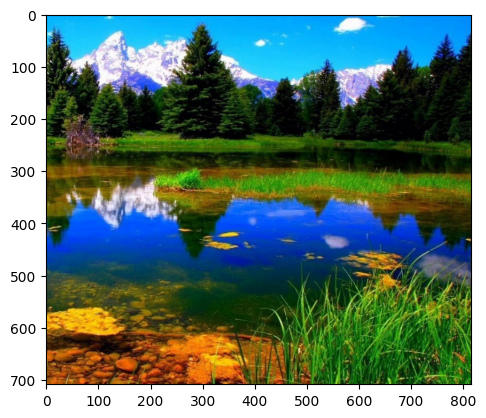

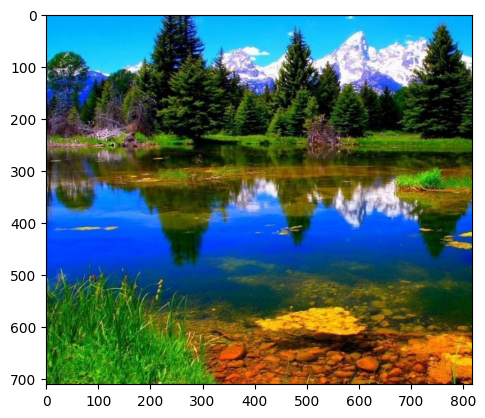

In [35]:
plt.imshow(cv2.cvtColor(left_panorama, cv2.COLOR_BGR2RGB))
plt.show()
plt.imshow(cv2.cvtColor(right_panorama, cv2.COLOR_BGR2RGB))
plt.show()

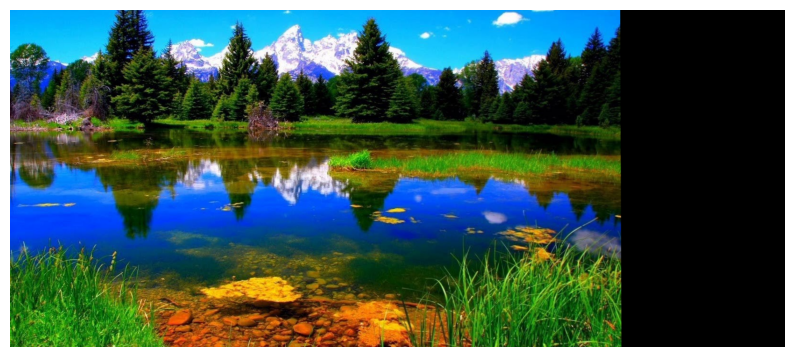

In [36]:
if len(matches) >= 4:  # Need at least 4 matches to compute homography
    left_keypoints_float = np.float32([kp.pt for kp in left_keypoints])
    right_keypoints_float = np.float32([kp.pt for kp in right_keypoints])

    points_left = np.float32([left_keypoints_float[m.queryIdx] for m in matches]).reshape(-1, 1, 2)
    points_right = np.float32([right_keypoints_float[m.trainIdx] for m in matches]).reshape(-1, 1, 2)

    H, mask = cv2.findHomography(points_left, points_right, cv2.RANSAC, 5.0)
    matches_mask = mask.ravel().tolist()

    left_height, left_width, channels = left_panorama.shape
    height = max(left_height, right_panorama.shape[0])
    panorama = cv2.warpPerspective(left_panorama, H, (left_width * 2, height))

    panorama[0:right_panorama.shape[0], 0:right_panorama.shape[1]] = right_panorama
    
    plt.figure(figsize=(10, 5))
    plt.imshow(cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB))  # Display in RGB format
    plt.axis('off')
    plt.show()
else:
    print("Not enough matches are found - %d/%d" % (len(matches), 4))
    matches_mask = None